<a href="https://colab.research.google.com/github/harim0207/KampenTeam/blob/Harim/Filter.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

import os
os.chdir("/content/drive/My Drive/APIpractice")
!ls

Mounted at /content/drive
 Ackblur.png	       AckTest1.png	        greyscale.png
 AckContrast.png       AckTest.png	        KampenNAIP.png
 AckDenoise1.png      'Article Overview.gdoc'   KampenNAIP.tif
 AckDenoise2.png       blur.png		        KampenSentinel.tif
 Ackerman.png	       Canny.png	        sharpen1.png
 Ackerman.tif	       Contrast.png	        sharpen2.png
 AckFilteredblur.png   Denoise1.png	        Test1.png
 AckFiltered.png       Denoise2.png	        testNAIP.tif
 AckGreen.png	       Filteredblur.png         Test.png
 Acksharpen1.png       Filtered.png	        testSentinel.tif
 Acksharpen2.png       Green.png


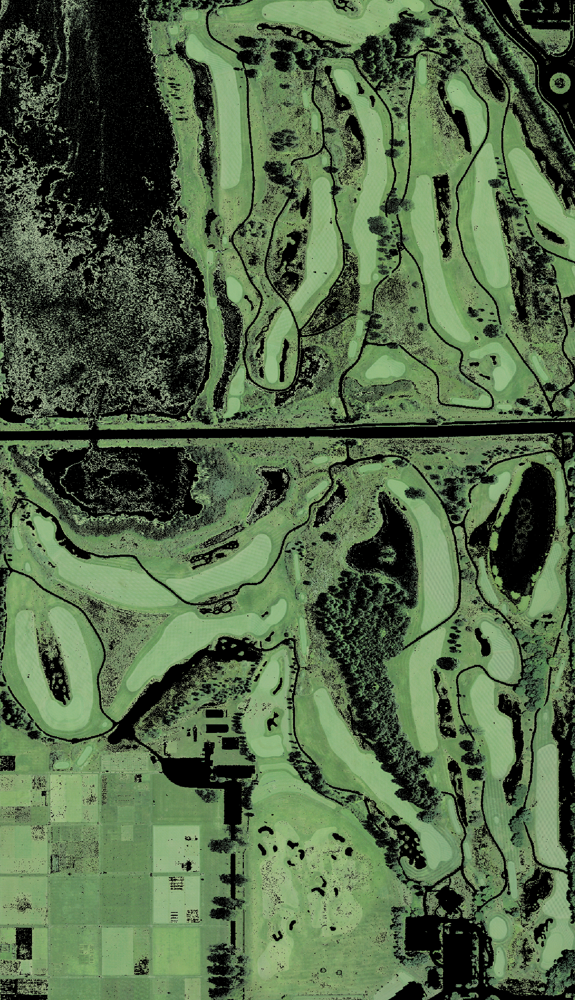

True

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

frame = cv2.imread("KampenNAIP.png")
hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
lower_green = np.array([40, 40, 40])
upper_green = np.array([70, 255, 255])
mask = cv2.inRange(hsv, lower_green, upper_green)
res = cv2.bitwise_and(frame,frame, mask= mask)

#cv2_imshow(frame)
#cv2_imshow(mask)
cv2_imshow(res)

cv2.imwrite("Green.png", res) 


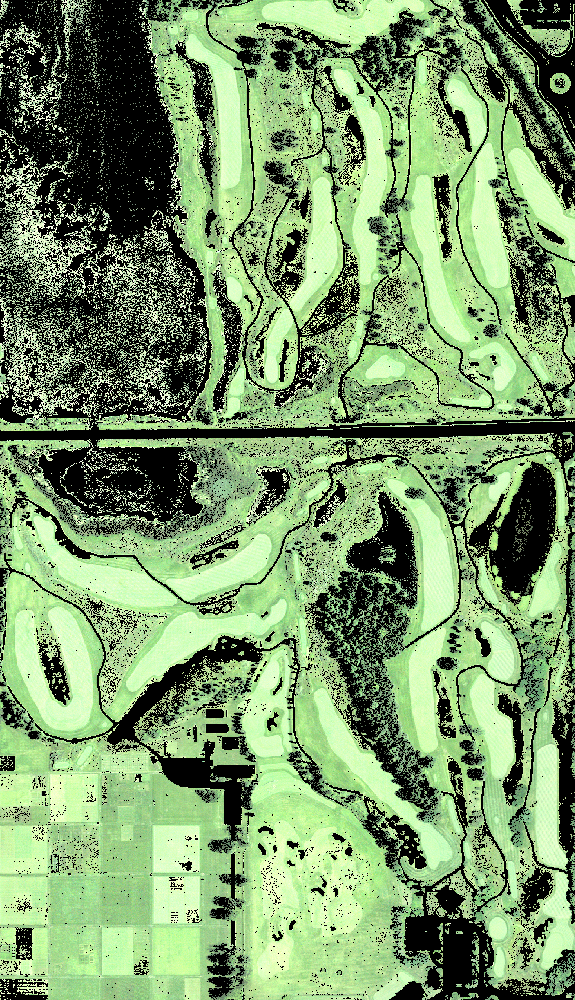

True

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

image = cv2.imread('Green.png')

alpha = 1.5 # Contrast control (1.0-3.0)
beta = 0 # Brightness control (0-100)

contrast = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
cv2_imshow(contrast)
#cv2.imwrite("Contrast.png", contrast) 

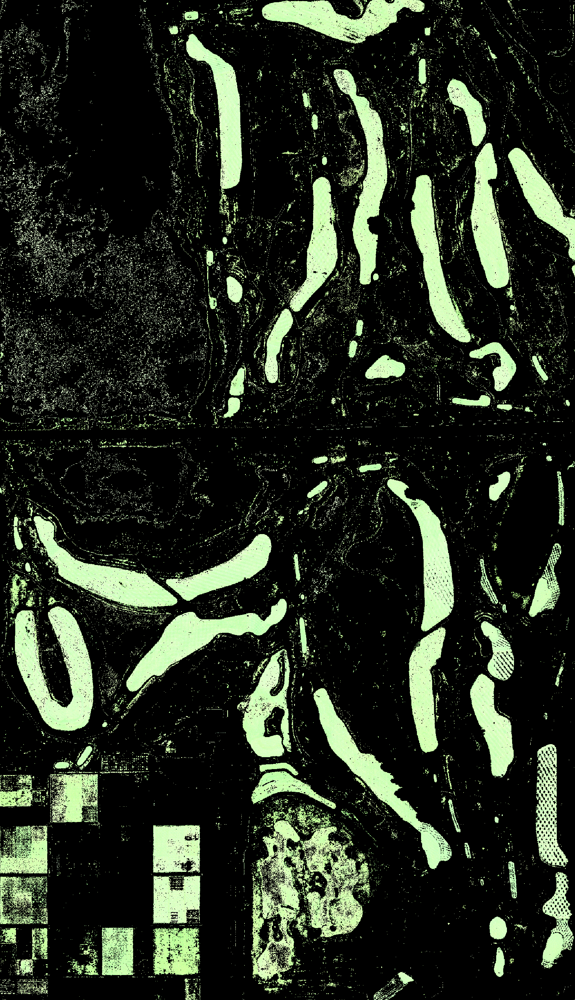

True

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

frame = cv2.imread("Contrast.png")
hsv2 = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
# Hue is from 0-180 (Green is in 40-70)
# Saturation: think adding grey makes image less saturated so grey = 0
# Value is brightness; 255 is white and 0 is black
lower_green2 = np.array([40, 0, 250])
upper_green2 = np.array([70, 255, 255])
mask2 = cv2.inRange(hsv2, lower_green2, upper_green2)
res2 = cv2.bitwise_and(frame,frame, mask= mask2)

#cv2_imshow(frame)
#cv2_imshow(mask)
cv2_imshow(res2)

#cv2.imwrite("Filtered.png", res2) 

In [ ]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
img = cv.imread('Filtered.png',0)
edges = cv.Canny(img,100,200)
plt.subplot(121),plt.imshow(img,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
plt.show()
cv.imwrite("Test.png", edges)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


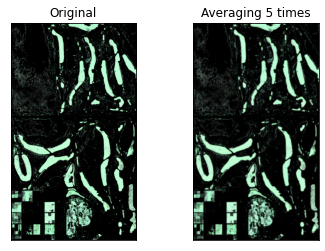

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

i = 0

# This chunk is for resetting the blur image to original
img = cv2.imread('Filtered.png')
kernel = np.ones((5,5),np.float32)/25
dst = cv2.filter2D(img,-1,kernel)
plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
cv2.imwrite("Filteredblur.png", dst)

# This chunk is for averaging multiple times for best blur
img = cv2.imread('Filteredblur.png')
dst = cv2.filter2D(img,-1,kernel)
plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
while i < 5:
  img = cv2.imread('Filteredblur.png')
  kernel = np.ones((5,5),np.float32)/25
  dst = cv2.filter2D(img,-1,kernel)
  cv2.imwrite("Filteredblur.png", dst) 
  i = i+1
plt.subplot(122),plt.imshow(dst),plt.title('Averaging ' + str(i) + ' times')
plt.xticks([]), plt.yticks([])
plt.show()

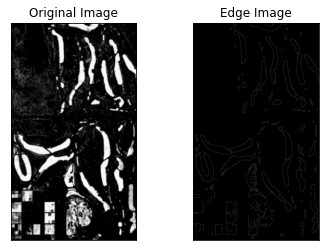

True

In [ ]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
img = cv.imread('Filteredblur.png',0)
edges = cv.Canny(img,100,200)
plt.subplot(121),plt.imshow(img,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
plt.show()
cv.imwrite("Test1.png", edges)

Next step: Fill in areas with area greater than an amount?

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img = cv2.imread('Filteredblur.png')
'''resize for imshow() visibility and also for if statement in conditional, 
without resize the smallest the less than part can be is 40000'''
#img = cv2.resize(img,(400,500)) 
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret,gray = cv2.threshold(gray,200,255,0)
gray2 = gray.copy()

contours, hier = cv2.findContours(gray,cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)
for cnt in contours:
    if 40000<cv2.contourArea(cnt):
        cv2.bitwise_not(gray2,gray2,mask)
        (x,y,w,h) = cv2.boundingRect(cnt)
        cv2.rectangle(gray2,(x,y),(x+w,y+h),0,-1)

#cv2_imshow(gray2)
#cv2.imwrite("Denoise1.png", gray2)

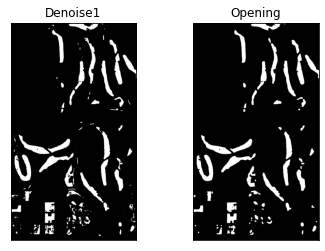

In [ ]:
# Filter: Morphological Transformation: opening
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
#from google.colab.patches import cv2_imshow
img = cv2.imread('Denoise1.png')
kernel = np.ones((12,12),np.uint8)
opening = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
#cv2_imshow(opening)
plt.subplot(121),plt.imshow(gray2,cmap = 'gray')
plt.title('Denoise1'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(opening,cmap = 'gray')
plt.title('Opening'), plt.xticks([]), plt.yticks([])
plt.show()
#cv2.imwrite("Denoise2.png", opening)

In [ ]:
import cv2
import numpy as np

img = cv2.imread('Denoise2.png', 0)
binary_map = (img > 0).astype(np.uint8)
connectivity = 4 # or whatever you prefer

output = cv2.connectedComponentsWithStats(binary_map, connectivity, cv2.CV_32S)
# The first cell is the number of labels
num_labels = output[0]
# The second cell is the label matrix
labels = output[1]
# The third cell is the stat matrix
stats = output[2]
# The fourth cell is the centroid matrix
centroids = output[3]
print(stats[:, 4])

[3750006   20671   18706    1140    6416   19858   18970   13892   19953
   16131    1540    5063    1248    3109    3342    1193     390     724
    1609    1034   18823   23709   15172    2729   24958   31719    1322
   15969     613   12436     479   14070   18248     252    2903    4926
     405     901     781    1423   10614    3733    1387    5709     701
     297     144   10201      84    1757     897     628     306     144
     347    1331     204     460     108    1593     220     228     221
     168    3566    2381     285     385     346    2168     781     774
     987     249     773]


In [ ]:
for i in stats:
  